In [1]:
import os
import torch
import pickle
from src.dataloader import (
    load_data,
    NoisyDataLoader,
    SimulationDataset
)
from src.models_multimodal import (
    load_model,
)
from collections import Counter
import sklearn
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
import umap
import numpy as np
from sklearn.decomposition import PCA

from src.utils import (
    get_valid_dir,
    set_seed,
    get_linear_predictions,
    get_knn_predictions,
    get_embs,
    is_subset,
    process_data_loader,
    print_metrics_in_latex,
    calculate_metrics,
    get_checkpoint_paths,
    mergekfold_results,
    save_normalized_conf_matrices,
    plot_pred_vs_true,
    get_class_dependent_predictions,
    generate_radar_plots,
    filter_classes,
)
from sklearn.ensemble import IsolationForest
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np
import pandas as pd
from imblearn.over_sampling import SMOTE
import umap
from sklearn.preprocessing import StandardScaler
from sklearn import manifold

device = "cuda" if torch.cuda.is_available() else "cpu"

sns.set_context("talk")

# Load models
set_seed(0)

KNNparameters = [1,2,3,5,7,8,9]

directories = [
#    "models/newest_models/clip_noisysimpretrain_clipreal",
    "models/newest_models/clip_real",
#    "models/newest_models/lc_3way_f1",
#    "models/newest_models/lc_reg",
]  # "ENDtoEND",
names = [
#    "clip-noisysimpretrain-clipreal",
    "clip-real"
#    "lc-3way-f1",
#    "lc-reg",
]

Random seed: 0


In [2]:
def plot_conf_matrix(y_test, y_pred, labels, title, kind, save=True):
    if kind == 'completeness':
        counts = confusion_matrix(y_test, y_pred, labels=labels, normalize=None)
        recall = confusion_matrix(y_test, y_pred, labels=labels, normalize='true')
        annotations = np.vectorize(lambda c, r: f'{r:.2g}\n({c})')(counts, recall)
        heatmap = pd.DataFrame(recall, index=labels, columns=labels)
    
    if kind == 'purity':
        counts = confusion_matrix(y_test, y_pred, labels=labels, normalize=None)
        recall = confusion_matrix(y_test, y_pred, labels=labels, normalize='pred')
        annotations = np.vectorize(lambda c, r: f'{r:.2g}\n({c})')(counts, recall)
        heatmap = pd.DataFrame(recall, index=labels, columns=labels)

    plt.figure(figsize=(5.5, 4.0))
    sns.heatmap(heatmap, annot=annotations, fmt='s', cmap='Blues', vmin=0, vmax=1, annot_kws={"fontsize":18})
    plt.title(title, fontsize=20)
    plt.ylabel('True class', fontsize=20)
    plt.xlabel('Predicted class', fontsize=20)
    if save:
        plt.savefig(f"{title}_cm.png",bbox_inches='tight',dpi=300)

In [3]:
models = []
paths = []
ids = []
labels = []

# Finding all checkpoints
for id, (directory, label) in enumerate(zip(directories, names)):
    paths_to_checkpoint, name, id = get_checkpoint_paths(directory, label, id)
    #print(paths_to_checkpoint)
    paths.extend(paths_to_checkpoint)
    ids.extend(id)
    labels.extend(name)

for i, path in enumerate(paths):
    print(f"loading {labels[i]}")
    models.append(load_model(path))
    break
print("finished loading models")

# Data preprocessing

data_dirs = [
    "ZTFBTS/",
    "/ocean/projects/phy230064p/shared/ZTFBTS/",
    "data/ZTFBTS/",
]
data_dir = get_valid_dir(data_dirs)

df = pd.read_csv(f"{data_dir}/ZTFBTS_TransientTable.csv")


data_dirs = [
    "ZTFBTS_spectra/",
    "data/ZTFBTS_spectra/",
]
spectra_dir = get_valid_dir(data_dirs)

# Default to 1 if the environment variable is not set
cpus_per_task = int(os.getenv("SLURM_CPUS_PER_TASK", 5))

# Assuming you want to leave one CPU for overhead
num_workers = max(1, cpus_per_task - 1)
print(f"Using {num_workers} workers for data loading", flush=True)

# Keeping track of all metrics
regression_metrics_list = []
classification_metrics_list = []
collect_classification_results = []
collect_regression_results = []

#fig, axs = plt.subplots(3, 5, figsize=(25, 15), sharex=True, sharey=True)
#axs = axs.ravel()
#plt.tight_layout()
#plt.subplots_adjust(hspace=0.1, wspace=0.1)

plot_idx = -1

tsne_plot = True


# Initialize lists to store data
all_mags, all_times, all_masks, all_redshifts, all_t_types = ([] for _ in range(5))

enc_dict = {'SN Ia':0, 'SN II':1, 'SN Ibc':2, 'SLSN-I':3, 'SN IIn':4}

idxs = np.arange(499_900)
np.random.shuffle(idxs)

Nmax = 50_000

allMet = False
for SNclass in ['SN Ia', 'SN II', 'SN Ib', 'SN Ic', 'SLSN-I', 'SN IIn']:
    i = 0
    dataloader = SimulationDataset("/Users/alexgagliano/Documents/Research/multimodal-supernovae/data/ZTF_Pretrain_5Class_redo.hdf5", transient_types=[SNclass])

    for idx in np.arange(Nmax):
        (_, mag, time, mask, _, _, _, redshift, t_type) = dataloader[idx]
        i+=1
        if np.nansum(mag) == 0:
            continue
        elif (SNclass in ['SN Ib', 'SN Ic']) and (i > (Nmax/2)):
            continue
        all_mags.append(mag)
        all_times.append(time)
        all_masks.append(mask)
        all_redshifts.append(redshift)
        all_t_types.append(t_type)

print(Counter(all_t_types))

# Concatenate lists into tensors
x_lc = torch.vstack(all_mags).float() 
t_lc = torch.vstack(all_times).float()
mask_lc = torch.vstack(all_masks)
all_redshifts = [t.unsqueeze(0) for t in all_redshifts] 
y_true = torch.cat(all_redshifts, dim=0).cpu().float().numpy() # redshifts

all_t_types = np.array(all_t_types)
all_t_types[all_t_types == 'SN Ib'] = 'SN Ibc'
all_t_types[all_t_types == 'SN Ic'] = 'SN Ibc'

y_true_label = torch.tensor([enc_dict[x] for x in all_t_types]) # class labels


print("Done retrieving simulated data, time to embed.")

for output, label, id in zip(models, labels, ids):
    plot_idx += 1
    if plot_idx > 0:
        continue
    if plot_idx == 0:
        run_idx = 0
        loopModel = label
    elif label == loopModel:
        run_idx+=1
    else:
        run_idx=0
    (
        model,
        combinations,
        regression,
        classification,
        n_classes,
        cfg,
        cfg_extra_args,
        train_filenames,
        val_filenames,
    ) = output

    print(label)

    #force the combination to just lightcurves
    cfg_extra_args['combinations'] = ['lightcurve']

    set_seed(cfg["seed"])

    model = model.to(device)
    model.eval()

    print("===============================")
    print(f"Model: {label}")
    print(f"Using data modalities: {cfg_extra_args['combinations']}")

    def format_combinations(combinations):
        if len(combinations) > 1:
            return ", ".join(combinations[:-1]) + " and " + combinations[-1]
        elif combinations:
            return combinations[0]
        return ""

    x_lc_exp = x_lc[..., None]  # Add channel dimension

    #batch these up 
    #break
    
    chunk_size = 5000  
    max_size = 30000
    embs_list = []
    class_list = []
    redshift_list = []
    
    # Iterate over the input tensors in chunks
    for i in range(0, x_lc_exp.size(0), chunk_size):
        print("embedding chunk %i...."%i)
        # Get the current chunk
        x_lc_exp_chunk = x_lc_exp[i:i+chunk_size]
        t_lc_chunk = t_lc[i:i+chunk_size]
        mask_lc_chunk = mask_lc[i:i+chunk_size]
        
        # Perform the operations on the chunk
        x_lc_enc_chunk = model.lightcurve_encoder(x_lc_exp_chunk, t_lc_chunk, mask_lc_chunk)
        embs_chunk = model.lightcurve_projection(x_lc_enc_chunk)
        
        # Append the result to the list
        embs_list.append(embs_chunk)
        class_list.append(y_true_label[i:i+chunk_size])
        redshift_list.append(y_true[i:i+chunk_size])
        
        #every 10k, save embeddings 
        if torch.vstack(embs_list).shape[0] > max_size:
            print("Saving batch")
            # Concatenate all the chunks into a single tensor
            #combine with class and redshift info
            #df = pd.DataFrame({'embs':torch.cat(embs_list, dim=0).detach().cpu().float().numpy(), 'class': torch.cat(class_list, dim=0).cpu().float().numpy(), 'redshift':np.concatenate(redshift_list)})
            
            #combine with class and redshift info
            df = pd.DataFrame(data=torch.cat(embs_list, dim=0).detach().cpu().float().numpy())
            df = df.add_prefix('embed_')
            df['class'] = torch.cat(class_list, dim=0).cpu().float().numpy()
            df['redshift'] = np.concatenate(redshift_list)
            df.to_parquet("/Users/alexgagliano/Documents/Research/multimodal-supernovae/data/embeddedSim_%s_%i.parquet"%(label,i))
            #free up memory
            embs_list = []
            class_list = []
            redshift_list = []
            del df

    # Spectral data is cut to this length
    dataset, nband, filenames_read, _ = load_data(
        data_dir,
        spectra_dir,
        max_data_len_spec=cfg_extra_args["max_spectral_data_len"],
        combinations=cfg_extra_args["combinations"],
        spectral_rescalefactor=cfg_extra_args["spectral_rescalefactor"],
        n_classes=5, # keep 5 classes for plotting
    )
    
    loader_no_aug = NoisyDataLoader(
        dataset,
        batch_size=cfg["batchsize"],
        noise_level_img=0,
        noise_level_mag=0,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True,
        combinations=cfg_extra_args["combinations"],
    )

        
    #redshift, class for validation
    y_true_obs, y_true_label_obs, y_pred_obs, lc_data_obs = process_data_loader(
        loader_no_aug,
        regression,
        classification,
        device,
        model,
        combinations=cfg_extra_args["combinations"],
    )

    x_lc_obs = lc_data_obs['x_lc']
    t_lc_obs = lc_data_obs['t_lc']
    mask_lc_obs = lc_data_obs['mask_lc']

    
    x_lc_exp_obs = x_lc_obs[..., None]  # Add channel dimension
    x_lc_enc_obs = model.lightcurve_encoder(x_lc_exp_obs, t_lc_obs, mask_lc_obs)
    embs_obs = model.lightcurve_projection(x_lc_enc_obs)

    #combine with class and redshift info
    df = pd.DataFrame(data=embs_obs.detach().cpu().numpy())
    df = df.add_prefix('embed_')
    df['class'] = y_true_label_obs
    df['redshift'] = y_true_obs

    df.to_parquet("/Users/alexgagliano/Documents/Research/multimodal-supernovae/data/embeddedObs_%s_%i.parquet"%(label, i%chunk_size))
    print("Done calculating and saving embeddings.")

loading clip-real
finished loading models
Using 4 workers for data loading
Counter({'SN Ia': 50000, 'SLSN-I': 50000, 'SN IIn': 49998, 'SN II': 49796, 'SN Ib': 24991, 'SN Ic': 24991})
Done retrieving simulated data, time to embed.
clip-real
Random seed: 0
Model: clip-real
Using data modalities: ['lightcurve']
embedding chunk 0....
embedding chunk 5000....
embedding chunk 10000....
embedding chunk 15000....
embedding chunk 20000....
embedding chunk 25000....
embedding chunk 30000....
Saving batch
embedding chunk 35000....
embedding chunk 40000....
embedding chunk 45000....
embedding chunk 50000....
embedding chunk 55000....
embedding chunk 60000....
embedding chunk 65000....
Saving batch
embedding chunk 70000....
embedding chunk 75000....
embedding chunk 80000....
embedding chunk 85000....
embedding chunk 90000....
embedding chunk 95000....
embedding chunk 100000....
Saving batch
embedding chunk 105000....
embedding chunk 110000....
embedding chunk 115000....
embedding chunk 120000....
e

100%|██████████████████████████████████████| 5170/5170 [00:16<00:00, 317.13it/s]


Loading redshifts...
Finished loading redshift
Loading transient classes...
Factorized types: array(['SLSN-I', 'SN II', 'SN IIn', 'SN Ia', 'SN Ibc'], dtype=object)
Finished loading transient classes.
Done calculating and saving embeddings.


In [4]:
import glob 

pretrain = False

if pretrain:
    fns = glob.glob("/Users/alexgagliano/Documents/Research/multimodal-supernovae/data/embeddedSim_*.parquet")
else: 
    fns = glob.glob("/Users/alexgagliano/Documents/Research/multimodal-supernovae/data/embeddedSim_clip-real_*.parquet")

data = []
y_true_label = []
y_true = []

for fn in fns:
    emb = pd.read_parquet(fn)
    data.append(np.array(emb[emb.columns[:-2]]))
    y_true.append(emb['redshift'].values)
    y_true_label.append(emb['class'].values)
data = np.concatenate(data)
y_true = np.concatenate(y_true)
y_true_label = np.concatenate(y_true_label)

if pretrain:
    fn_obs = glob.glob("/Users/alexgagliano/Documents/Research/multimodal-supernovae/data/embeddedObs_*.parquet")
else: 
    fn_obs = glob.glob("/Users/alexgagliano/Documents/Research/multimodal-supernovae/data/embeddedObs_clip-real_*.parquet")

emb_obs = pd.read_parquet(fn_obs[0])
data_obs = np.array(emb_obs[emb_obs.columns[:-2]])
y_true_obs = np.array(emb_obs['redshift'].values)
y_true_label_obs = np.array(emb_obs['class'].values)

In [5]:
#load data and plot 
enc_dict = {'SN Ia':0, 'SN II':1, 'SN Ibc':2, 'SLSN-I':3, 'SN IIn':4}
enc_dict_obs = {'SN Ia':3, 'SN II':1, 'SN Ibc':4, 'SLSN-I':0, 'SN IIn':2}

#fig = plt.figure(figsize=(12, 12))
#axs = fig.gca()

#data = embs 
#data_obs = embs_obs 

try:
    y_true_label_obs = y_true_label_obs.numpy()
    y_true_label = y_true_label.numpy()
except:
    print("y_true_label is already a numpy array")

class_labels = []

plotset = list(enc_dict.values())
class_labels = list(enc_dict.keys())

plotbool = np.array([x in np.array(plotset) for x in y_true_label]) #only do 5-way classification
plotbool_obs = np.array([x in np.array(plotset) for x in y_true_label_obs]) #only do 5-way classification

pca = PCA(n_components=50)
data_all = np.concatenate([data, data_obs])
data_pca_all = pca.fit_transform(data_all)

tsne_model = manifold.TSNE(n_components=2, random_state=0, perplexity=10)

#tsne_model = tsne.fit(data);
Ndata = data.shape[0]
trans_data_all = tsne_model.fit_transform(data_pca_all).T;
trans_data = trans_data_all[:, 0:Ndata]
trans_data_obs = trans_data_all[:, Ndata:]

y_true_label is already a numpy array


NameError: name 'data' is not defined

In [3]:
ZTF = pd.read_csv("./data/ZTFBTS/ZTFBTS_TransientTable.csv")
Counter(ZTF['type'])

#Counter(y_true_label_obs)

Counter({'SN Ia': 3762,
         'SN II': 648,
         'SN IIn': 135,
         'SN Ia-91T': 112,
         'SN Ic': 103,
         'SN Ib': 92,
         'SN IIb': 73,
         'SN IIP': 50,
         'SN Ic-BL': 50,
         'SLSN-I': 40,
         'SN Ia-91bg': 29,
         'nova': 28,
         'SN Ia-pec': 23,
         'SN Ibn': 23,
         'SLSN-II': 21,
         'TDE': 20,
         'SN Ib/c': 14,
         'SN Iax': 11,
         'SN Ia-CSM': 8,
         'SN II-pec': 7,
         'SN Icn': 5,
         'SN Ia-SC': 5,
         'LBV': 3,
         'SN Ib-pec': 3,
         'other': 2,
         'LRN': 2,
         'ILRT': 2,
         'Ca-rich': 1,
         'SN Ic-pec': 1})

y_true_label is already a numpy array


/var/folders/y1/n43fk0m97tg8sbqh5j222kqw0000gn/T/ipykernel_99465/4286619610.py:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.get_cmap(cmaps[j])(0.8), label=class_labels[class_label], markersize=10, mec='none'))
/var/folders/y1/n43fk0m97tg8sbqh5j222kqw0000gn/T/ipykernel_99465/4286619610.py:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.get_cmap(cmaps[j])(0.8), label=class_labels[class_label], markersize=10, mec='none'))
/var/folders/y1/n43fk0m97tg8sbqh5j222kqw0000gn/T/ipykernel_9

Text(0.5, 0, 'tSNE axis 1')

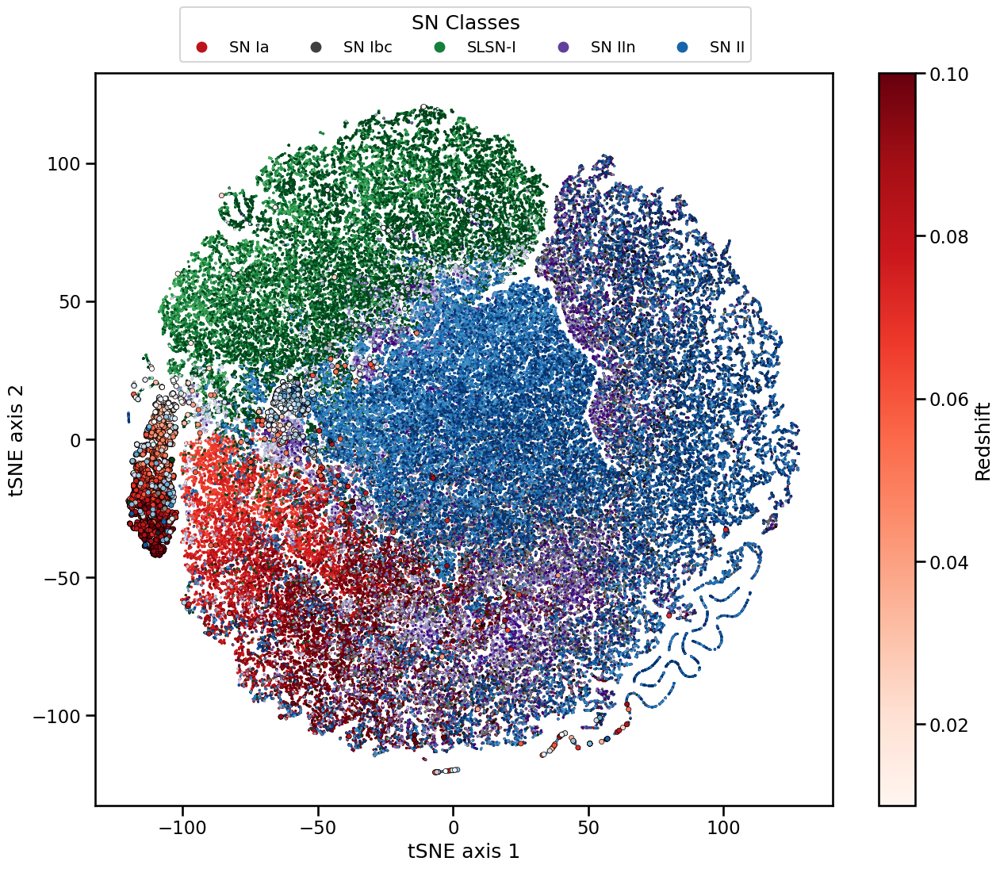

In [7]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

enc_dict = {'SN Ia':0, 'SN II':1, 'SN Ibc':2, 'SLSN-I':3, 'SN IIn':4}
enc_dict_obs = {'SN Ia':3, 'SN II':1, 'SN Ibc':4, 'SLSN-I':0, 'SN IIn':2}


#load data and plot 
simData = pd.read_csv("tsne_simData.csv")
obsData =  pd.read_csv("tsne_obsData.csv")
trans_data = np.array(simData[['0', '1']]).T
trans_data_obs = np.array(obsData[['0', '1']]).T

y_true =simData['redshift'].values
y_true_label = simData['class'].values

y_true_obs = obsData['redshift'].values
y_true_label_obs = obsData['class'].values

plotset = list(enc_dict.values())
class_labels = list(enc_dict.keys())

fig = plt.figure(figsize=(15, 12))
axs = fig.gca()

try:
    y_true_label_obs = y_true_label_obs.numpy()
    y_true_label = y_true_label.numpy()
except:
    print("y_true_label is already a numpy array")

unique_labels = plotset  # Get unique labels
cmaps=['Reds','Greys', 'Greens', 'Purples', 'Blues']

from matplotlib.colors import LogNorm

handles = []

norm = Normalize(vmin=0.01, vmax=0.1)  # Adjust as needed

for j, class_label in enumerate([0, 2, 3, 4, 1]):
        # Select indices for data points with this label
        class_label_obs = enc_dict_obs[[key for key, value in enc_dict.items() if value == class_label][0]]
    
        indices = [i for i, l in enumerate(y_true_label) if l == class_label]
        indices_obs = [i for i, l in enumerate(y_true_label_obs) if l == class_label_obs]

        # Plot data points for this label
        if (len(indices) > 1) or (len(indices_obs) > 1):
            sns.scatterplot(x=trans_data[0, indices], y=trans_data[1, indices], hue=y_true[indices], palette=cmaps[j], hue_norm=norm, ax=axs, s=5, marker='o', edgecolor='none', legend=False)
            sns.scatterplot(x=trans_data_obs[0, indices_obs], y=trans_data_obs[1, indices_obs], hue=y_true_obs[indices_obs], hue_norm=norm, palette=cmaps[j], ax=axs, s=20,lw=0.5, edgecolor='k', marker='o', legend=False, zorder=1000)
        else: 
            print(class_label)
                
        handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.get_cmap(cmaps[j])(0.8), label=class_labels[class_label], markersize=10, mec='none'))

        # Create a colorbar
        if j == 0:
            sm = ScalarMappable(cmap=cmaps[j], norm=norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, ax=axs)
            cbar.set_label('Redshift')  # Set the label for the colorbar
            
plt.legend(handles=handles, title="SN Classes", ncol=5, title_fontsize=18, fontsize=14, bbox_to_anchor=(0.9, 1.1))

plt.ylabel("tSNE axis 2")
plt.xlabel("tSNE axis 1")
#plt.savefig(f"tsne_plots_simData_mavenLite.png",dpi=500, bbox_inches='tight')

In [80]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.colors import LogNorm

simData = pd.read_csv("tsne_simData.csv")
obsData =  pd.read_csv("tsne_obsData.csv")

sns.set_context("talk", font_scale=1.8)

#load data and plot 
def plot(simData, obsData, fn="tsne_plots_simData_maven_class.png", save=True, ctype='class'):
    enc_dict = {'SN Ia':0, 'SN II':1, 'SN Ibc':2, 'SLSN-I':3, 'SN IIn':4}
    enc_dict_obs = {'SN Ia':3, 'SN II':1, 'SN Ibc':4, 'SLSN-I':0, 'SN IIn':2}

    trans_data = np.array(simData[['0', '1']]).T
    trans_data_obs = np.array(obsData[['0', '1']]).T
    
    y_true =simData['redshift'].values
    y_true_label = simData['class'].values
    
    y_true_obs = obsData['redshift'].values
    y_true_label_obs = obsData['class'].values
    
    plotset = list(enc_dict.values())
    class_labels = list(enc_dict.keys())
    
    enc_dict = {'SN Ia':0, 'SN II':1, 'SN Ibc':2, 'SLSN-I':3, 'SN IIn':4}
    enc_dict_obs = {'SN Ia':3, 'SN II':1, 'SN Ibc':4, 'SLSN-I':0, 'SN IIn':2}

    if ctype=='class':
        fig = plt.figure(figsize=(15, 15))
    else:
        fig = plt.figure(figsize=(19, 15))

    axs = fig.gca()
    
    try:
        y_true_label_obs = y_true_label_obs.numpy()
        y_true_label = y_true_label.numpy()
    except:
        print("y_true_label is already a numpy array")
    
    unique_labels = plotset  # Get unique labels
    #cmaps=['tab:red','grey', 'tab:green', 'tab:purple', 'tab:blue']
    #red, purple, blue-grey, dark purple, green
    if ctype == 'class':
        cmaps = ['#97212B', '#590FA9', '#0081A7', '#B07156', '#2F744A']
    elif ctype == 'redshift':
        cmaps = ['gist_stern']*5
    handles = []
    
    norm = Normalize(vmin=0.01, vmax=0.12)  # Adjust as needed
    
    for j, class_label in enumerate([0, 2, 3, 4, 1]):
            # Select indices for data points with this label
            class_label_obs = enc_dict_obs[[key for key, value in enc_dict.items() if value == class_label][0]]
        
            indices = [i for i, l in enumerate(y_true_label) if l == class_label]
            indices_obs = [i for i, l in enumerate(y_true_label_obs) if l == class_label_obs]
    
            # Plot data points for this label
            if (len(indices) > 1) or (len(indices_obs) > 1):
                if ctype == 'class':
                    sns.scatterplot(x=trans_data[0, indices], y=trans_data[1, indices], facecolor=cmaps[j], ax=axs, s=5, marker='o',edgecolor='none', legend=False)
                    sns.scatterplot(x=trans_data_obs[0, indices_obs], y=trans_data_obs[1, indices_obs], c=cmaps[j], ax=axs, s=20,lw=0.5, edgecolor='k', marker='o', legend=False, zorder=1000)
                elif ctype == 'redshift':
                    sns.scatterplot(x=trans_data[0, indices], y=trans_data[1, indices], palette=cmaps[j], hue=y_true[indices], ax=axs, s=5, hue_norm=norm, marker='o',edgecolor='none', legend=False)
                    sns.scatterplot(x=trans_data_obs[0, indices_obs], y=trans_data_obs[1, indices_obs], palette=cmaps[j], hue=y_true_obs[indices_obs], ax=axs, s=20,lw=0.5, hue_norm=norm, edgecolor='k', marker='o', legend=False, zorder=1000)                    
            else: 
                print(class_label)

            if ctype == 'class':
                handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmaps[j], label=class_labels[class_label], markersize=10, mec='none'))
    
            # Create a colorbar
            if (j == 0) and (ctype == 'redshift'):
                sm = ScalarMappable(cmap=cmaps[j], norm=norm)
                sm.set_array([])
                cbar = plt.colorbar(sm, ax=axs)
                cbar.set_label('Redshift')  # Set the label for the colorbar

    if ctype == 'class':
        plt.legend(handles=handles, title="SN Classes", ncol=5, bbox_to_anchor=(0.9, 1.25))
    
    plt.ylabel("tSNE axis 2")
    plt.xlabel("tSNE axis 1")
    if save:
        plt.savefig(f"{fn}_{ctype}.png",dpi=500, bbox_inches='tight')
    else: 
        plt.show()

y_true_label is already a numpy array
y_true_label is already a numpy array


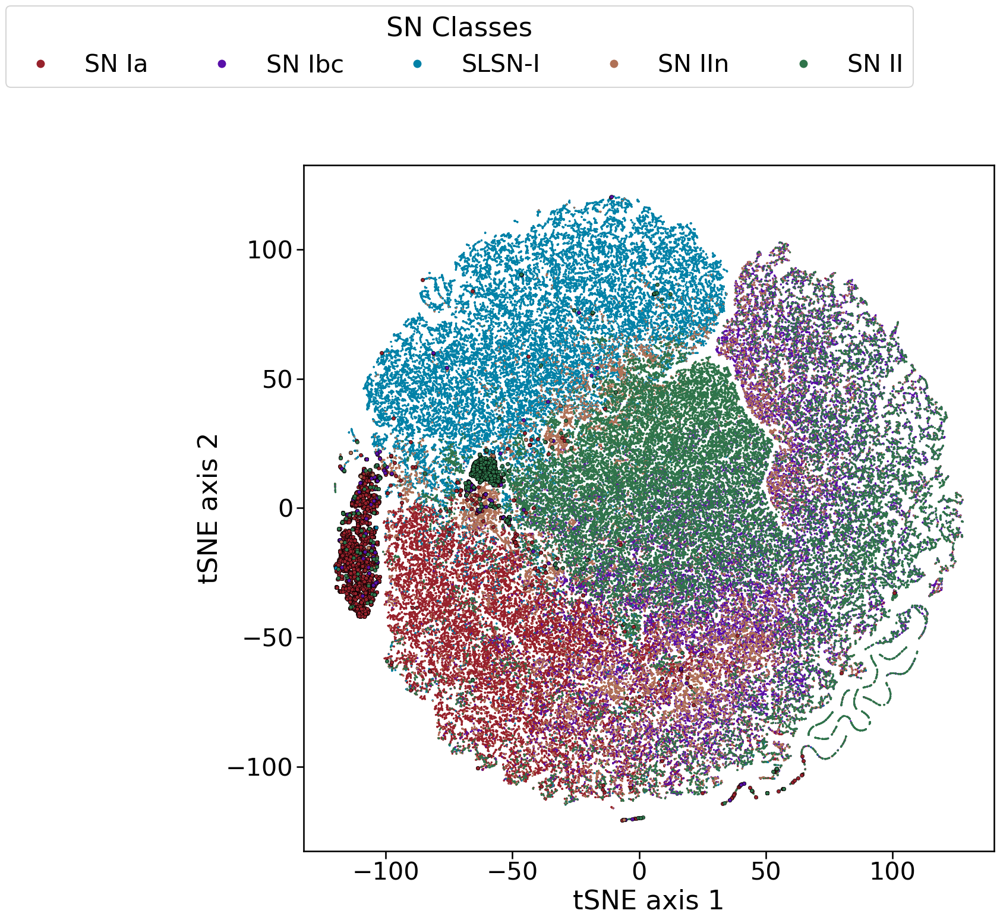

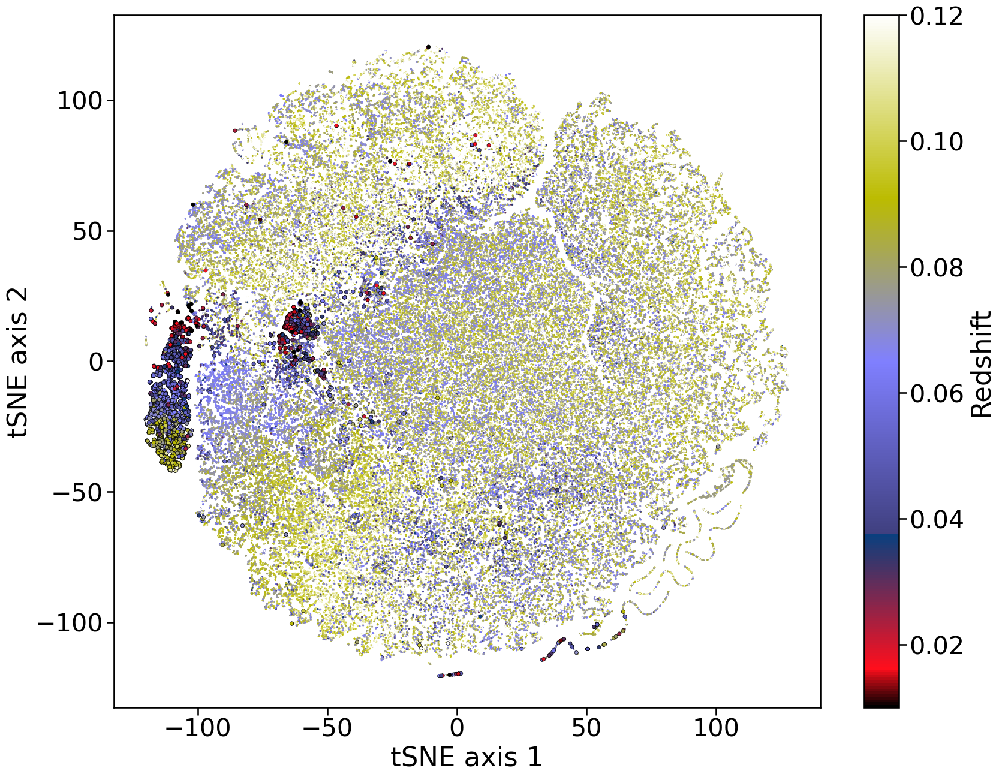

In [81]:
plot(simData, obsData, fn="tsne_plots_simData_maven", save=True, ctype='class')
plot(simData, obsData, fn="tsne_plots_simData_maven", save=True, ctype='redshift')

y_true_label is already a numpy array
y_true_label is already a numpy array


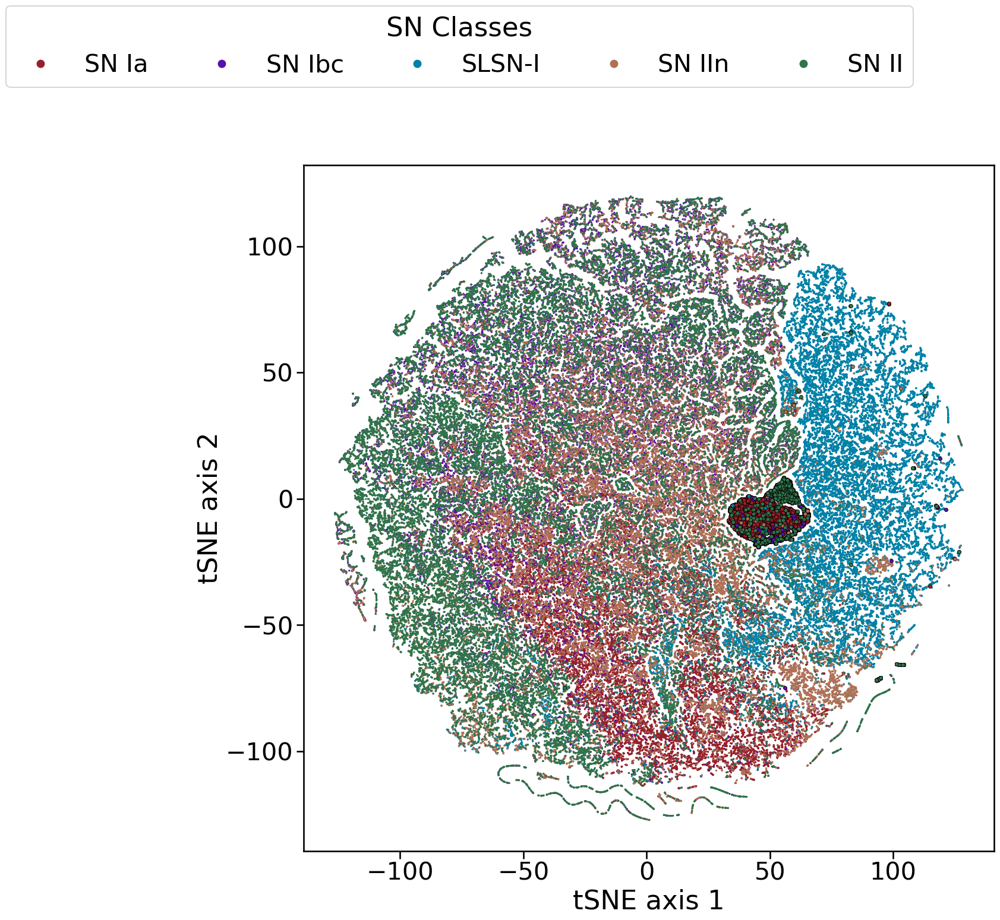

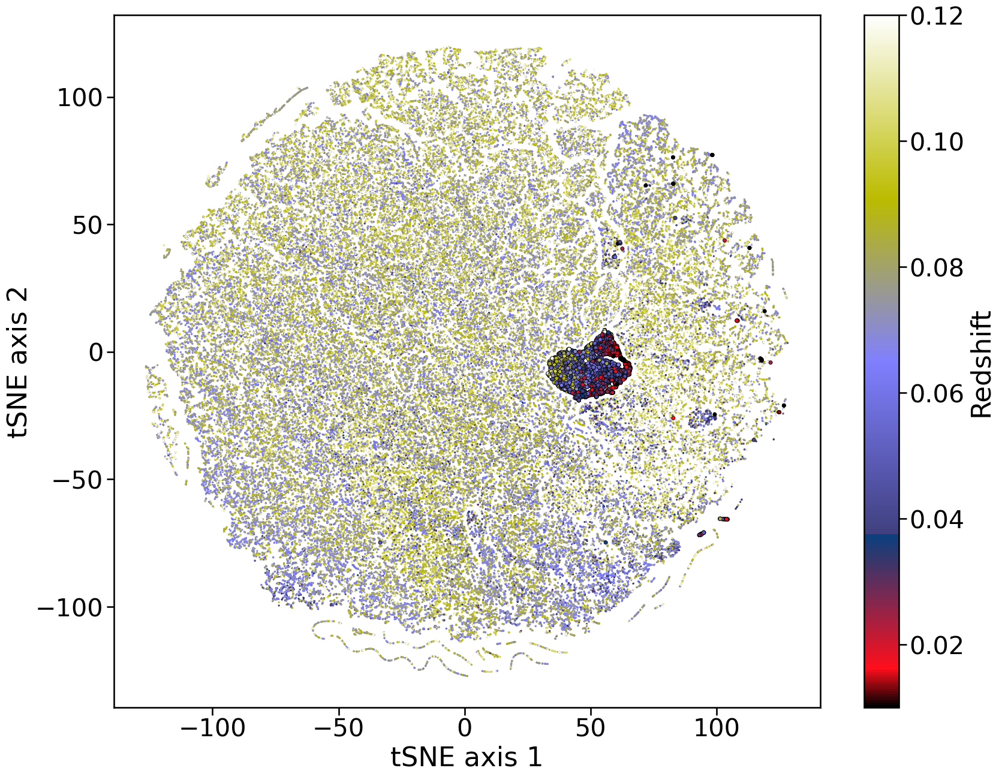

In [82]:
#save the same for the maven-lite
simData = pd.read_csv("tsne_simData_mavenLite.csv")
obsData =  pd.read_csv("tsne_obsData_mavenLite.csv")

plot(simData, obsData, fn="tsne_plots_simData_mavenLite", save=True, ctype='class')
plot(simData, obsData, fn="tsne_plots_simData_mavenLite", save=True, ctype='redshift')

In [9]:
simData = pd.DataFrame(data=trans_data.T)
simData['redshift'] = y_true
simData['class'] = y_true_label
simData.to_csv("tsne_simData_mavenLite.csv",index=False)

In [11]:
obsData = pd.DataFrame(data=trans_data_obs.T)
obsData['redshift'] = y_true_obs
obsData['class'] = y_true_label_obs
obsData.to_csv("tsne_obsData_mavenLite.csv",index=False)